## Interpretability

In [1]:
import numpy as np
from matplotlib import pyplot as plt

from keras.preprocessing.image import load_img
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions

# load already pre-trained model
model = VGG16(weights='imagenet', include_top=True) 

# print a list of layers with all the details
model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

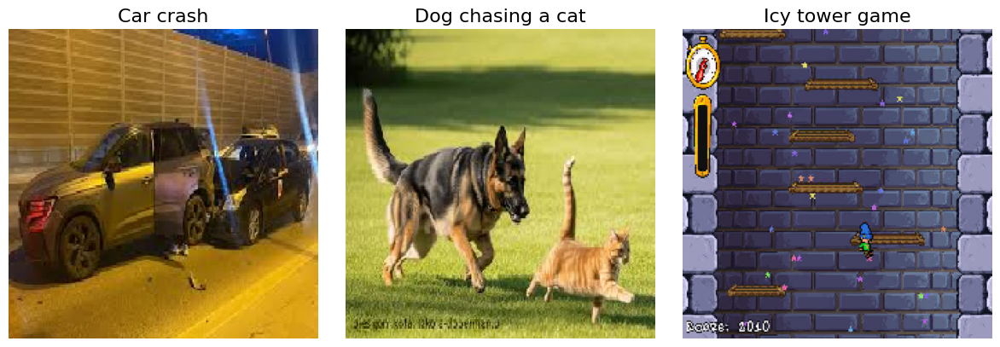

In [2]:
# assign image titles for your images
image_titles = ['Car crash', 'Dog chasing a cat', 'Icy tower game']
 
# load images and reshape them
# we resize the images into size 224 x 224, as the model prefers those sizes
# if your images are smaller, you can change those values a little bit
img1 = load_img('./images/car_crash.jpg', target_size=(224, 224))
img2 = load_img('./images/cat_and_dog.jpg', target_size=(224, 224))
img3 = load_img('./images/icy_tower.jpg', target_size=(224, 224))

# convert them to a NumPy array
images = np.asarray([np.array(img1), np.array(img2), np.array(img3)])
 
# preparing input data for VGG16
# apply preprocessing function specific to VGG network (you have already imported it)
X = preprocess_input(images)
 
# rendering
_, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [3]:
# predict the output (probabilities) of the layer, corresponding to an image
# feed images into the network and see the results (use "predict" function)
preds = model.predict(X)

# find the best class (use argmax or argsort function)
best_class = np.argmax(preds, axis=1)

# decode prediction based on ImageNet dataset dictionary
# each numerical class is assigned to a real-life label
print('Image1 - predicted:', decode_predictions(preds, top=3)[0])
print('Image2 - predicted:', decode_predictions(preds, top=3)[1])
print('Image3 - predicted:', decode_predictions(preds, top=3)[2])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step
Image1 - predicted: [('n03977966', 'police_van', np.float32(0.21652156)), ('n03384352', 'forklift', np.float32(0.18799217)), ('n04252225', 'snowplow', np.float32(0.05811991))]
Image2 - predicted: [('n02106662', 'German_shepherd', np.float32(0.84192085)), ('n02105162', 'malinois', np.float32(0.068567015)), ('n02096294', 'Australian_terrier', np.float32(0.01572831))]
Image3 - predicted: [('n06794110', 'street_sign', np.float32(0.58647233)), ('n06874185', 'traffic_light', np.float32(0.28286046)), ('n04548280', 'wall_clock', np.float32(0.04371298))]


### Visualizing heatmaps

In [4]:
from matplotlib import cm

from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.scorecam import Scorecam
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

In [5]:
# function used to visualize the output heatmap
def visualise_heatmap(map):
    _, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

    for i, title in enumerate(image_titles):
        heatmap = np.uint8(cm.jet(map[i])[..., :3] * 255)
        ax[i].set_title(title, fontsize=16)
        ax[i].imshow(images[i])
        ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
        ax[i].axis('off')
    
    plt.tight_layout()
    plt.show()

#### GradCAM

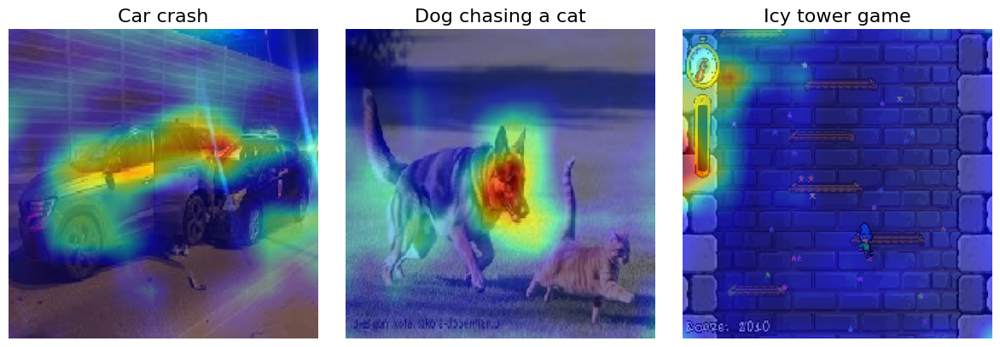

In [6]:
replace2linear = ReplaceToLinear()
score = CategoricalScore(list(best_class))

gradcam = Gradcam(model, model_modifier=replace2linear, clone=True)
cam = gradcam(score, X, penultimate_layer=-1)
visualise_heatmap(cam)

#### GradCAM++

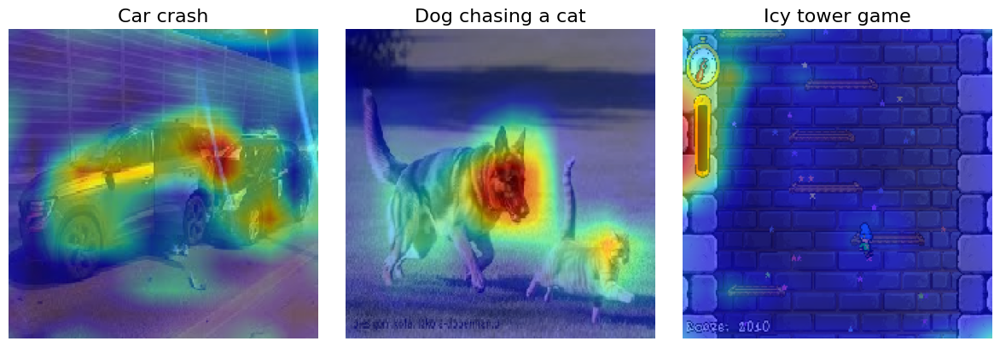

In [7]:
gradcam = GradcamPlusPlus(model, model_modifier=replace2linear, clone=True)
cam = gradcam(score, X, penultimate_layer=-1)
visualise_heatmap(cam)

#### ScoreCAM

c:\Users\micha\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\models\functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=('Tensor(shape=(32, 224, 224, 3))',)
  warnings.warn(msg)


48/48 ━━━━━━━━━━━━━━━━━━━━ 125s 3s/step


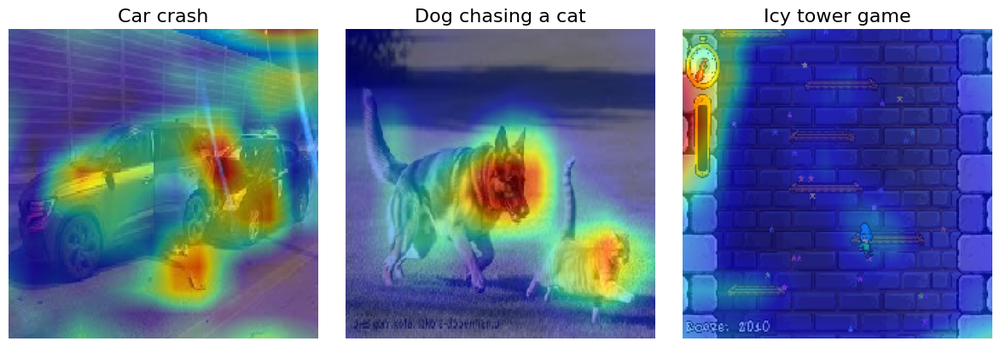

In [8]:
scorecam = Scorecam(model)
cam = scorecam(score, X, penultimate_layer=-1)
visualise_heatmap(cam)

#### Saliency Maps

c:\Users\micha\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\models\functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(3, 224, 224, 3))']
  warnings.warn(msg)


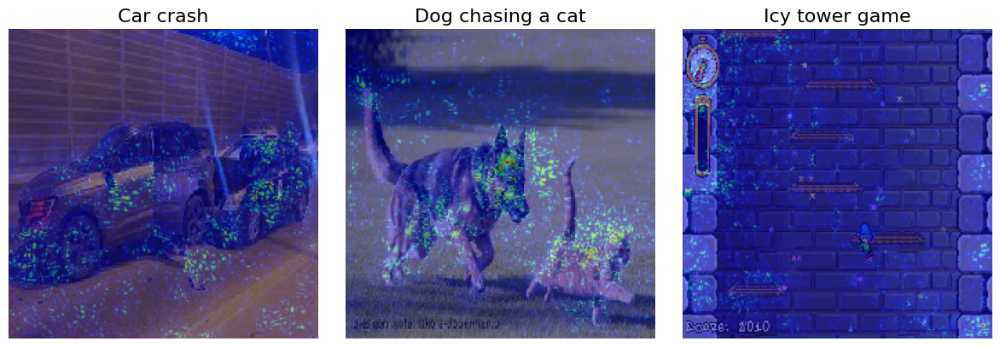

In [9]:
saliency = Saliency(model, model_modifier=replace2linear, clone=True)
saliency_map = saliency(score, X)
visualise_heatmap(saliency_map)

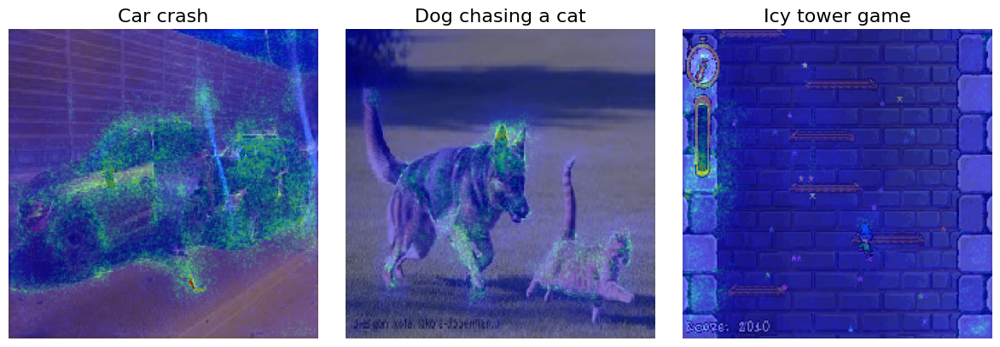

In [10]:
# smoothing outputs
saliency_map = saliency(score, X, smooth_samples=20, smooth_noise=0.2)
visualise_heatmap(saliency_map)

#### Checking the second best class heatmap

In [11]:
checked_class = np.argsort(preds, axis=1)
checked_class = checked_class[:, -2]
score = CategoricalScore(list(checked_class))

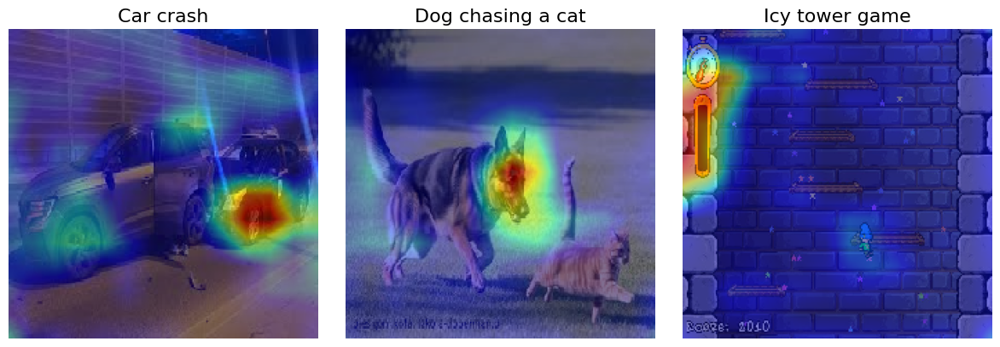

In [12]:
gradcam = Gradcam(model, model_modifier=replace2linear, clone=True)
cam = gradcam(score, X, penultimate_layer=-1)
visualise_heatmap(cam)

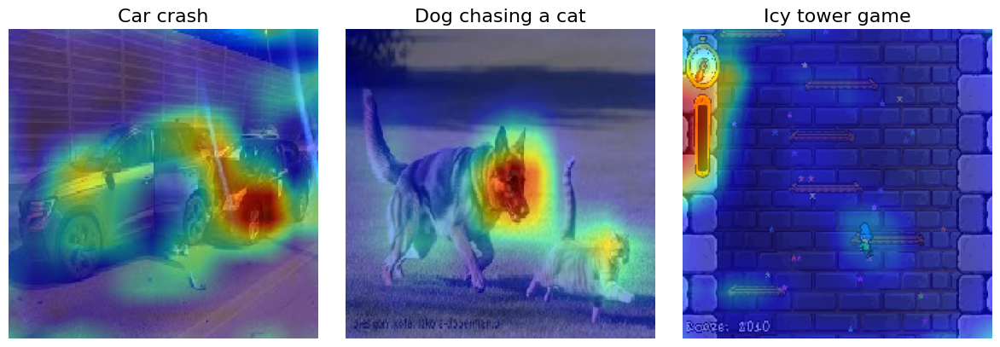

In [13]:
gradcam = GradcamPlusPlus(model, model_modifier=replace2linear, clone=True)
cam = gradcam(score, X, penultimate_layer=-1)
visualise_heatmap(cam)

### Visualizing intermediate activations

In [14]:
from keras import models

# loop through the model defined in the beginning to access outputs of individual layers
layer_outputs = [layer.output for layer in model.layers]
activation_model = models.Model(model.input, layer_outputs)

# take one image and reshape it into size (1, 224, 224, 3)
X_reshaped = np.reshape(img1, shape=(1, 224, 224, 3))

# use the "predict" function on the activation model to get the intermediate activations
activations = activation_model.predict(X_reshaped)
 
layer_names = []

for layer in model.layers[:-1]:
    layer_names.append(layer.name)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


In [15]:
# function responsible for visualizing intermediate outputs for a chosen layer
def visualize_layer_outputs(layer_names, activations, chosen_layer_name, images_per_row = 16):
    for layer_name, layer_activation in zip(layer_names, activations):
        # specify the name of the layer that you want to see
        # choose one name from the model summary we printed in the beginning
        if layer_name == chosen_layer_name:
            number_of_feature_maps = layer_activation.shape[-1]
            feature_map_shape = layer_activation.shape[1]
            n_cols = number_of_feature_maps // images_per_row
            display_grid = np.zeros((feature_map_shape * n_cols, images_per_row * feature_map_shape))

            for col in range(n_cols):
                for row in range(images_per_row):
                    channel_image = layer_activation[0,:, :, col * images_per_row + row]
                    channel_image /= np.max(channel_image)
                    display_grid[
                        col * feature_map_shape : (col + 1) * feature_map_shape,
                        row * feature_map_shape : (row + 1) * feature_map_shape
                    ] = channel_image
            
            scale = 1. / feature_map_shape
            
            plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
            plt.imshow(display_grid, aspect='auto', cmap='viridis')

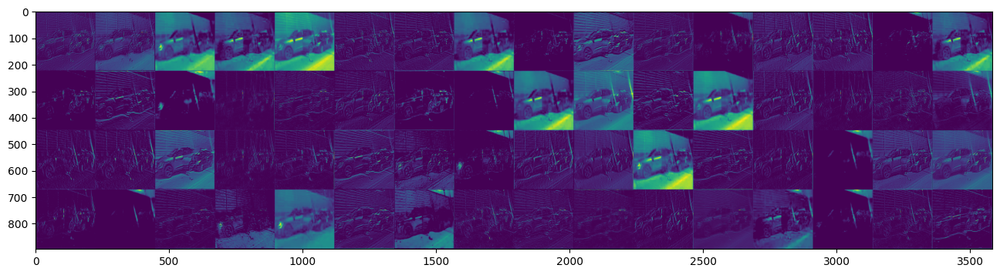

In [16]:
# visualizing an early layer
visualize_layer_outputs(layer_names, activations, "block1_conv2")

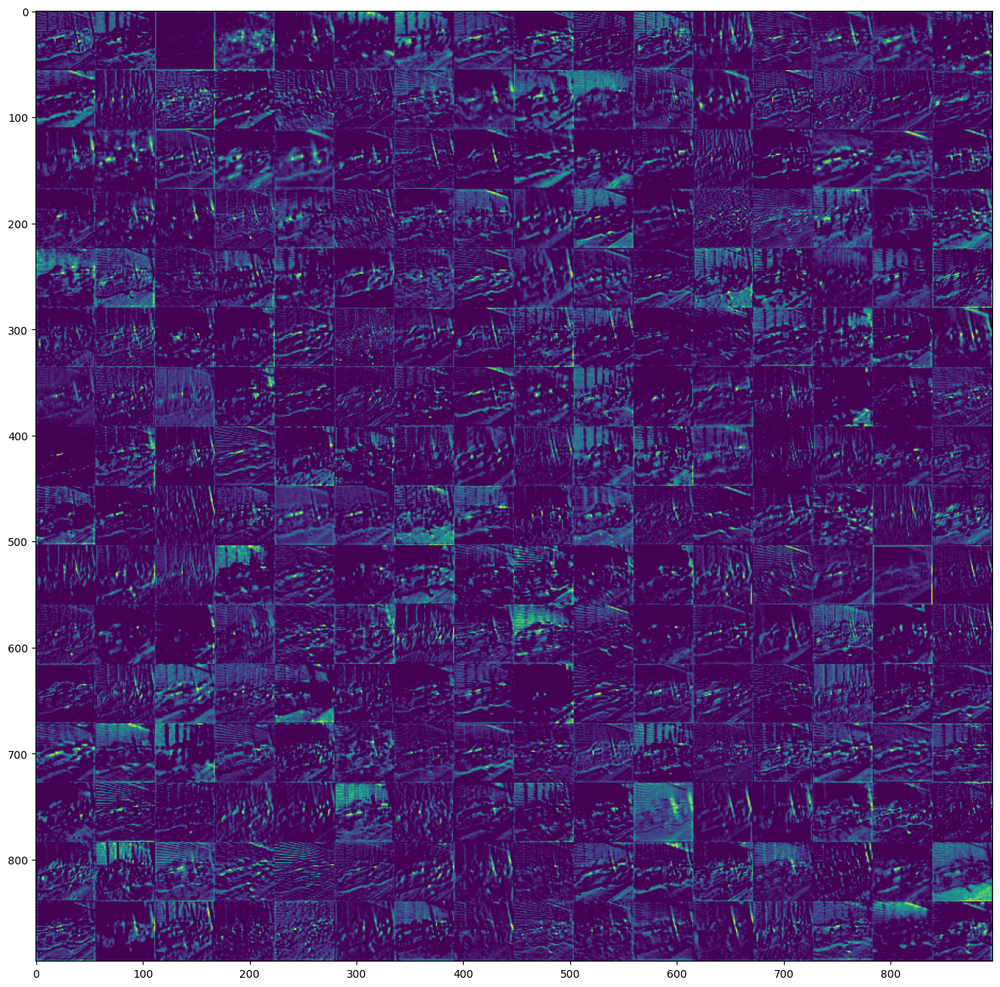

In [17]:
# visualizing a middle layer
visualize_layer_outputs(layer_names, activations, "block3_conv1")

C:\Users\micha\AppData\Local\Temp\ipykernel_12540\1284651684.py:15: RuntimeWarning: invalid value encountered in divide
  channel_image /= np.max(channel_image)


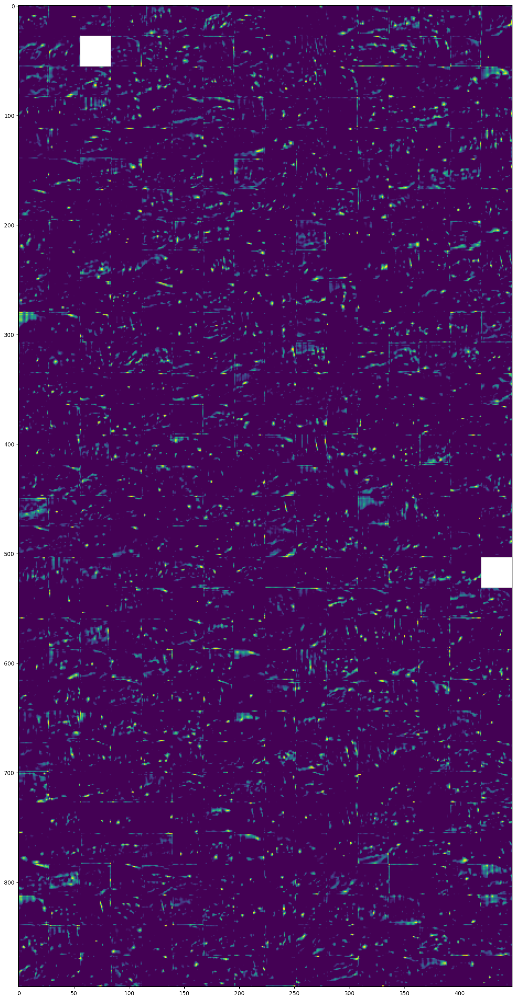

In [18]:
# visualizing a deep layer
visualize_layer_outputs(layer_names, activations, "block4_conv3")

##### Question
Do you know why there is a different number of images for different layers? Do you know why some images resemble the input and some not?

##### Answer
I think it depends on a number of channels - in this model the deeper the layer, the greater number of convolution filters. It is also the reason why some images do not resemble the input - further convolution layers operate on a greatly preprocessed input, while some "early" ones are still close to the original image.


---

### Attention maps in Vision Transformers

Unfortunately, there is a problem with `vit-keras` library. It relies on a `tensorflow_addons` library, which is deprecated and no longer supported. No version was compatible with `tensorflow` versions available for my **Python** version, so I abandoned this task.